# Assignment 8
# 62070501030 Thornthan Yasukam

**Import Library**

In [1]:
import math 
import numpy as np
import matplotlib.image as mpimg 
import matplotlib.pyplot as plt
import matplotlib.cm as cm
import scipy as sp
import random
import cv2
from PIL import Image
from pylab import *

-----

**Import image**

468 400


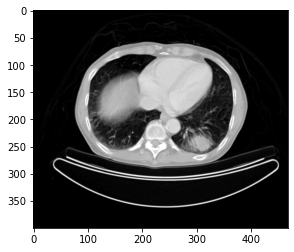

In [127]:
# input image
im_input = Image.open('brain.png')

# Size of image
plt.figure()
plt.imshow(im_input)
col, row = im_input.size
print(col, row)

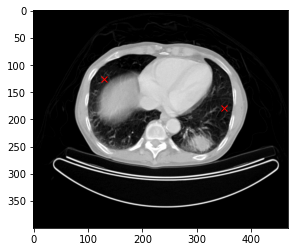

In [3]:
# Get target point by mark
# (x,y) = (130,125) is left brain;
# (x,y) = (350,180) is Right brain;

plt.plot(130, 125, 350, 180, marker='x', color="Red")
plt.imshow(im_input)
plt.show()

-----

**Implement Region growing**

**1. Create coordinate**

In [4]:
# Create class of coordinate
class Point:
    def __init__(self,x,y):
        self.x = x
        self.y = y
        self.coordinate = (x, y)
    
    # format of coordinate
    def __str__(self):
        return('({}, {})'.format(self.x, self.y))

    def getX(self):
          return self.x
    def getY(self):
          return self.y

**2. N-8 connectivity**

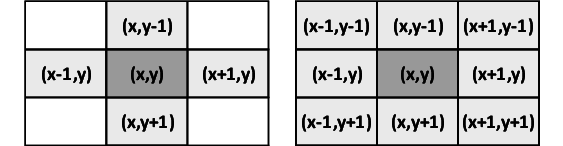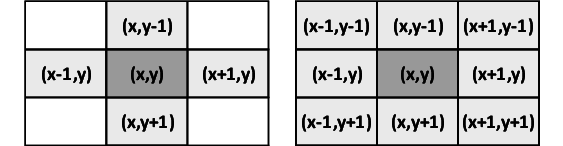

In [5]:
# Display 8-connectivity
listA = [-1, 0 ,1]
listB = [-1, 0 ,1]
for x in listA:
    for y in listB:
        print(x,y)

-1 -1
-1 0
-1 1
0 -1
0 0
0 1
1 -1
1 0
1 1


In [6]:
# 8-connectivity Function
def n8_connect(current_point,image):
    listA = [-1, 0 ,1]
    listB = [-1, 0 ,1]
    n8_groups = []

    col, row = image.size
    xmax = col-1
    ymax = row-1
    #print(xmax,ymax)

    for x in listA:
        for y in listB:
            #print(x,y)
            connected_pixel_x = current_point.x + x
            connected_pixel_y = current_point.y + y

            # Checking point of 8-connectivity
            if ( (connected_pixel_x >= 0) and (connected_pixel_x <= xmax) == True ) and \
               ( (connected_pixel_y >= 0) and (connected_pixel_y <= ymax) == True ) and \
               ( ((connected_pixel_x != current_point.x) == True) or ((connected_pixel_y != current_point.y)) == True ):
                 n8_groups.append(Point(connected_pixel_x, connected_pixel_y)) 

    return n8_groups
     

**3. Region growing**

*region of Left brain*

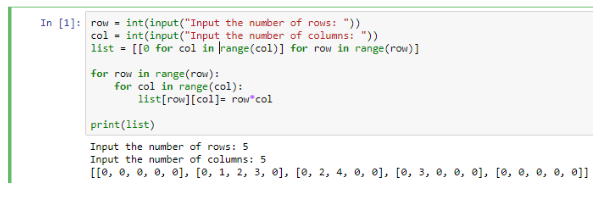

In [128]:
# Get Region

# 1. Get with 2D array
# height, weight = img.shape
# img_rg_left = np.zeros(img.shape)

# 2. Get with 2D list
col, row = im_input.size
rg_left = [[0 for i in range(col)] for j in range(row)]

In [295]:
rg_left

[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,


In [129]:
# Get seed

seed_point_left = Point(130,125)
print(seed_point_left.coordinate)

# Add seed to region
rg_left[seed_point_left.y][seed_point_left.x] = 255
print("pixel region at coordinate",seed_point_left.coordinate," : ", rg_left[125][130])

(130, 125)
pixel region at coordinate (130, 125)  :  255


In [130]:
# Get Gray Value in region for compare to growing
# https://www.geeksforgeeks.org/python-pil-getpixel-method/

print(im_input.getpixel(seed_point_left.coordinate))

(20, 20, 20, 255)


In [131]:
#Get group of seed
seed_group_left = n8_connect(seed_point_left, image = im_input)

In [132]:
seed_group_left

**Implement threshold**

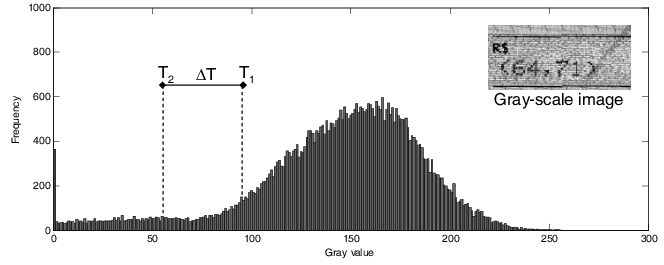

In [12]:
def getGrayDiff(T2,T1,T):
    return abs(T2 - T1) <= T

# Test 
# getGrayDiff(130,125,70)

In [133]:
# Average Gray value in seed
gray_in_seed = im_input.getpixel(seed_point_left.coordinate)[0]
gray_in_seed

20

So threadsold is abs(gray_point - 255) <= threshold

In [ ]:
# Region Growing
threshold = int(input("Enter the threshold :"))
pixel_count = 1
is_growing = True

# Loop until stop growing
while(is_growing == True):
    new_seed_group_left = []
    growing_count = 0
    
    for point in seed_group_left:
        
        # Element for compare
        
        # # Average Gray at point
        gray_in_point = im_input.getpixel(point.coordinate)[0]
        
        # point in region
        is_point_img_region = rg_left[point.y][point.x]
        
        # Thresold comparing
        print(" abs(" ,gray_in_point, ") - (" , gray_in_seed , ") <= ", threshold)
        smaller_than_threshold = getGrayDiff( T2 = gray_in_point,
                                              T1 = gray_in_seed, 
                                              T = threshold )
        
        # compare with threshold and make sure that point doesn't in region
        if(smaller_than_threshold == True) and (is_point_img_region != 255 ):
            
            # add to group seed
            rg_left[point.y][point.x] = 255
            
            # Calculate new Gray value in point
            gray_in_seed = ( (gray_in_seed  * pixel_count) + gray_in_point ) / ( pixel_count + 1)
            
            # increate growing point
            growing_count += 1 
            
            # increate pixel in region
            pixel_count += 1
            
            # Calculate is N8-Connectivity
            neighbors = n8_connect(point, image = im_input)
            
            # Add new point of seed
            for n in neighbors: new_seed_group_left.append(n)
    
    #after check point add new seeds to seed group
    seed_group_left = new_seed_group_left.copy()
    
    # if pixel not going, break for get out loop
    if growing_count == 0: is_growing = False
    
#print(img_rg_left)            

Enter the threshold : 70


 abs( 37 ) - ( 20 ) <=  70
 abs( 32 ) - ( 28.5 ) <=  70
 abs( 32 ) - ( 29.666666666666668 ) <=  70
 abs( 24 ) - ( 30.25 ) <=  70
 abs( 24 ) - ( 29.0 ) <=  70
 abs( 28 ) - ( 28.166666666666668 ) <=  70
 abs( 24 ) - ( 28.142857142857142 ) <=  70
 abs( 24 ) - ( 27.625 ) <=  70
 abs( 45 ) - ( 27.22222222222222 ) <=  70
 abs( 49 ) - ( 29.0 ) <=  70
 abs( 49 ) - ( 30.818181818181817 ) <=  70
 abs( 41 ) - ( 32.333333333333336 ) <=  70
 abs( 32 ) - ( 33.0 ) <=  70
 abs( 32 ) - ( 33.0 ) <=  70
 abs( 24 ) - ( 32.92857142857143 ) <=  70
 abs( 20 ) - ( 32.92857142857143 ) <=  70
 abs( 49 ) - ( 32.92857142857143 ) <=  70
 abs( 49 ) - ( 32.92857142857143 ) <=  70
 abs( 41 ) - ( 32.92857142857143 ) <=  70
 abs( 37 ) - ( 33.46666666666667 ) <=  70
 abs( 32 ) - ( 33.46666666666667 ) <=  70
 abs( 24 ) - ( 33.46666666666667 ) <=  70
 abs( 20 ) - ( 33.46666666666667 ) <=  70
 abs( 24 ) - ( 33.46666666666667 ) <=  70
 abs( 49 ) - ( 33.46666666666667 ) <=  70
 abs( 41 ) - ( 33.46666666666667 ) <=  70
 abs( 

In [135]:
rg_left

[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,


In [136]:
col, row = im_input.size
im_out_left = im_input
# pixels value of image
# change pixel that have 255.0 to Red
pixels = im_out_left.load()
for x in range(col):
	for y in range(row):
		# if pixel is in region, color it
		if rg_left[y][x] == 255.0:
			pixels[x, y] = (255, 0, 0, 255) # Red

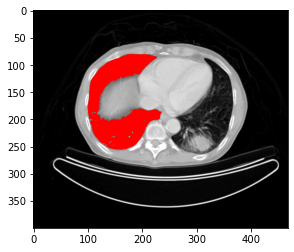

In [137]:
imshow(im_out_left)

In [138]:
image_left = im_out_left

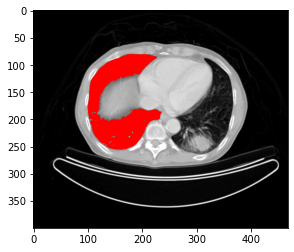

In [37]:
imshow(image_left)

*region of Right brain*

In [111]:
# Get Region

# 1. Get with 2D array
# height, weight = img.shape
# img_rg_left = np.zeros(img.shape)

# 2. Get with 2D list
col, row = im_input.size
rg_right = [[0 for i in range(col)] for j in range(row)]

In [112]:
rg_right

[[0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,
  0,


In [113]:
# Get seed

seed_point_right = Point(350,180)
print(seed_point_right.coordinate)

# Add seed to region
rg_right[seed_point_right.y][seed_point_right.x] = 255
print("pixel region at coordinate",seed_point_right.coordinate," : ", rg_right[180][350])

(350, 180)
pixel region at coordinate (350, 180)  :  255


In [114]:
print(im_input.getpixel(seed_point_right.coordinate))

(16, 16, 16, 255)


In [115]:
#Get group of seed
seed_group_right = n8_connect(seed_point_right, image = im_input)

In [116]:
seed_group_right

In [117]:
# Average Gray value in seed
gray_in_seed = im_input.getpixel(seed_point_right.coordinate)[0]
gray_in_seed

16

In [119]:
# Region Growing
threshold = int(input("Enter the threshold :"))
pixel_count = 1
is_growing = True

# Loop until stop growing
while(is_growing == True):
    new_seed_group_right = []
    growing_count = 0
    
    for point in seed_group_right:
        
        # Element for compare
        
        # # Average Gray at point
        gray_in_point = im_input.getpixel(point.coordinate)[0]
        
        # point in region
        is_point_img_region = rg_right[point.y][point.x]
        
        # Thresold comparing
        print(" abs(" ,gray_in_point, ") - (" , gray_in_seed , ") <= ", threshold)
        smaller_than_threshold = getGrayDiff( T2 = gray_in_point,
                                              T1 = gray_in_seed, 
                                              T = threshold )
        
        # compare with threshold and make sure that point doesn't in region
        if(smaller_than_threshold == True) and (is_point_img_region != 255 ):
            
            # add to group seed
            rg_right[point.y][point.x] = 255
            
            # Calculate new Gray value in point
            gray_in_seed = ( (gray_in_seed  * pixel_count) + gray_in_point ) / ( pixel_count + 1)
            
            # increate growing point
            growing_count += 1 
            
            # increate pixel in region
            pixel_count += 1
            
            # Calculate is N8-Connectivity
            neighbors = n8_connect(point, image = im_input)
            
            # Add new point of seed
            for n in neighbors: new_seed_group_right.append(n)
    
    #after check point add new seeds to seed group
    seed_group_right = new_seed_group_right.copy()
    
    # if pixel not going, break for get out loop
    if growing_count == 0: is_growing = False           

Enter the threshold : 70


 abs( 37 ) - ( 16 ) <=  70
 abs( 24 ) - ( 26.5 ) <=  70
 abs( 12 ) - ( 25.666666666666668 ) <=  70
 abs( 24 ) - ( 22.25 ) <=  70
 abs( 12 ) - ( 22.6 ) <=  70
 abs( 24 ) - ( 20.833333333333332 ) <=  70
 abs( 16 ) - ( 21.285714285714285 ) <=  70
 abs( 16 ) - ( 20.625 ) <=  70
 abs( 45 ) - ( 20.11111111111111 ) <=  70
 abs( 45 ) - ( 22.6 ) <=  70
 abs( 28 ) - ( 24.636363636363637 ) <=  70
 abs( 32 ) - ( 24.916666666666668 ) <=  70
 abs( 24 ) - ( 25.46153846153846 ) <=  70
 abs( 28 ) - ( 25.46153846153846 ) <=  70
 abs( 24 ) - ( 25.642857142857142 ) <=  70
 abs( 16 ) - ( 25.642857142857142 ) <=  70
 abs( 45 ) - ( 25.642857142857142 ) <=  70
 abs( 28 ) - ( 25.642857142857142 ) <=  70
 abs( 12 ) - ( 25.642857142857142 ) <=  70
 abs( 37 ) - ( 24.733333333333334 ) <=  70
 abs( 12 ) - ( 24.733333333333334 ) <=  70
 abs( 24 ) - ( 24.733333333333334 ) <=  70
 abs( 16 ) - ( 24.733333333333334 ) <=  70
 abs( 12 ) - ( 24.733333333333334 ) <=  70
 abs( 28 ) - ( 24.733333333333334 ) <=  70
 abs( 12 ) 

In [120]:
col, row = im_input.size
im_out_right = im_input
# pixels value of image
# change pixel that have 255.0 to Red
pixels = im_out_right.load()
for x in range(col):
	for y in range(row):
		# if pixel is in region, color it
		if rg_right[y][x] == 255:
			pixels[x, y] = (255, 0, 0, 255) # Red

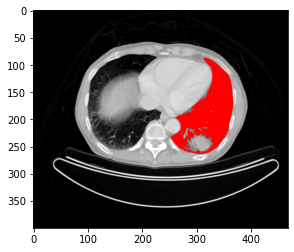

In [121]:
imshow(im_out_right)

-------

**4.Coloring two Region that implement by region growing algorithm** 

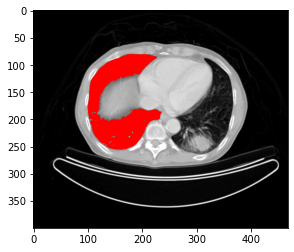

In [139]:
imshow(im_out_left)

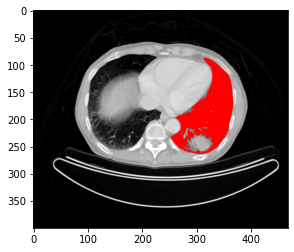

In [140]:
imshow(im_out_right)

In [141]:
one_side = im_out_left

In [142]:
col, row = one_side.size
full_brain_colored = one_side
# pixels value of image
# change pixel that have 255.0 to Red
pixels = full_brain_colored.load()
for x in range(col):
	for y in range(row):
		# if pixel is in region, color it
		if rg_right[y][x] == 255:
			pixels[x, y] = (255, 0, 0, 255) # Red

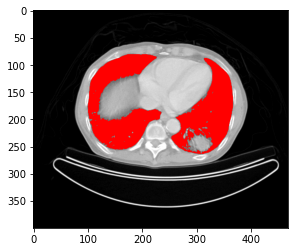

In [143]:
imshow(full_brain_colored)

------

*Reference*


http://www.ecpe.nu.ac.th/panomkhawn/imagepro/pdf/ch10.pdf

https://developpaper.com/simple-implementation-of-region-growing-in-python/

https://stackoverflow.com/questions/8417733/implementing-8-connectivity-connected-component-labeling-in-python

https://www.geeksforgeeks.org/point-processing-in-image-processing-using-python-opencv/

https://stackoverflow.com/questions/43923648/region-growing-python